# Domácí úkol č. 2 - 🕸 Síťová analýza PID

## 📚 Data
Jako dataset nám poslouží [otevřená data Pražské integrované dopravy](https://pid.cz/o-systemu/opendata/). Konkrétně budeme pracovat s daty [cestovních řádů](https://pid.cz/o-systemu/opendata/#h-gtfs), která jsou původně ve formátu GTFS (General Transit Feed Specification). To je formát, který využívá široká škála softwarových aplikací a kvůli tomu jej při publikaci dat využívají také veřejné dopravní agentury včetně PID.

☝️**Pozor!** Pro řešení domácí úlohy vám poskytneme už připravený dataset $D$ ve formátu `csv`. Dataset $D$ jsme pro vás sestavili z dat, která pocházejí z [cestovních řádů](https://pid.cz/o-systemu/opendata/#h-gtfs). Více informací o všech souborech a jejich atributech lze nalézt v [dokumentaci formátu GTFS](https://developers.google.com/transit/gtfs/reference).

## Zadání
> ☝️ Používejte markdown buňky! Zdůvodňujte všechny důležité kroky, popisujte vizualizace a co je z nich možné pozorovat. Za nepřehledný domácí úkol nebudou uděleny body.

Za řádné průběžné komentování a vizuální prezentaci postupu a výsledků lze získat až 4 body. Úkol řešíte jako **jednotlivci**.

**✨ Dataset**
* Načtěte si data ze souboru `d.csv`, což je již zmíněný dataset $D$, který obsahuje záznam pro každé dvě **po sobě jdoucí** zastávky nějakého spoje.
* Struktura je následující (pro zjednodušení neuvažujeme service start_date a end_date):
| stop_from | stop_from_name | stop_to | stop_to_name | depart_from | arrive_to | route_type | is_night | mon | tue | wed | thu | fri | sat | sun |
| --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- |
| U699Z3P | Stadion Strahov | U981Z1P | Koleje Strahov | 7:24:00 | 7:25:00 | 3 | 0 | 1 | 1 | 1 | 1 | 1 | 0 | 0 |

* Jedinečným identifikátorem zastávky je **název zastávky**. Pozor na stejné názvy zastávek pro různé dopravní prostředky - u takových zastávek uvažujte, že se jedná o jednu a tutéž stanici.

**⚙️ Předzpracování dat**

* Atributy `depart_from` a `arrive_to` budete chtít nejspíše upravit. Obsahují totiž časové údaje delší než 24 hodin (celkem se jedná o 1.5 % záznamů). Z reference formátu GTFS (info o sloupci, z kterého vznikl `depart_from` a `arive_to`): _Arrival time at a specific stop for a specific trip on a route. … For times occurring after midnight on the service day, enter the time as a value greater than 24:00:00 in HH:MM:SS local time for the day on which the trip schedule begins._ Nicméně narazíte i na chybné časy, které začínají s hodnotou větší než 24. Všechny tyto případy můžete vyřešit pomocí **modulo 24** ☝️.


**🕸️ Základní síťová analýza** (celkem 12 bodů)

Úkolem je analyzovat síť zastávek PID. Zastávky tedy budou uzly sítě. Mezi dvěma zastávkami je orientovaná hrana, pokud jsou to dvě po sobě jdoucí zastávky nějakého spoje (existuje alespoň jeden záznam v datasetu $D$ s odpovídajícími `stop_from`, `stop_to`). Váha hrany je rovna počtu dopravních prostředků, které na dané trase za období jednoho týdne projedou.

Postupujte následovně:
* Začněte volbou libovolného balíčku pro analýzu a vizualizaci sítí (lze využít i zmíněný NetworkX),
* z datasetu $D$ vytvořte reprezentaci dat, která je vhodná pro vámi zvolený vizualizační balíček,
* vytvořte vizualizaci sítě (celkem za 4 body) - vizualizace musí být čitelná, proto můžete vizualizovat i podčást sítě (např. pro určitý dopravní prostředek, např. tramvaje (kromě vizualizace sítě lanovky nebo metra, tu neuznáváme) nebo nějaký podgraf - řešení ponecháme na vás),
* pomocí alespoň tří měr centrality analyzujte důležitost zastávek za období jednoho týdne (pondělí - neděle) a komentujte slovně, co tyto míry vzhledem ke konkrétním datům znamenají (každá míra za 2 body, celkem tedy za 6 bodů),
* vytvořte vizualizaci pro alespoň jednu míru centrality (celkem za 2 body).

**❓ Vlastní otázky** (3 body za každou otázku, celkem max. 9 bodů)

Vytvořte 3 otázky (můžete i více), založené na filtraci datasetu $D$ a odpovídejte na ně vhodnými vizualizacemi. Otázky pro inspiraci:
* Mění se důležité zastávky v závislosti na denním/nočním provozu?
* Je rozdíl ve vytíženosti zastávek během pracovního týdne/víkendu?
* ...

**🔥 Data navíc**

V souboru `stops.txt` je u každé zastávky uvedena **zeměpisná šířka a délka**. Tato data můžete využít pro rozšíření své analýzy a také vám mohou pomoci při layoutování grafu. ☝️ Pozor na stejné názvy zastávek s trochu jinou lokací pro různé dopravní prostředky. Je třeba navrhnout nějaké řešení (např. první, průměr, těžiště mnohoúhelníku apod., libovolně dle vašeho úsudku) a to zdůvodnit.

### Bodové hodnocení
Shrnutí bodů, které můžete nejvýše získat:
- 4 body za průběžné komentáře a vizuální prezentaci postupu a výsledků,
- 4 body za vizualizaci sítě,
- 6 bodů za komentovanou analýzu alespoň 3 měr centrality,
- 2 body za vizualizaci jedné z měr centrality,
- 9 bodů za definici a zodpovězení minimálně tří vlastních otázek.

Celkem lze za domácí úkol č. 2 získat maximálně 25 bodů.

In [1]:
# a teď už je to na vás 💪
# níže vložte své řešení
import re
import math 
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.ticker as ticker
import matplotlib.cm as cm
from pandas.api.types import CategoricalDtype
from datetime import datetime
import networkx as nx



In [2]:
data = pd.read_csv("d.csv")

In [3]:
stop = pd.read_csv("stops.txt")

In [4]:
# display(data.head())
# print("Shape: ", data.shape)
# display(data.info())

In [5]:
#24:51:35 -> 00:51:35

data[['depart_from_hours', 'depart_from_minutes', 'depart_from_seconds']] = data['depart_from'].str.split(':', expand=True)
data[['arrive_to_hours', 'arrive_to_minutes', 'arrive_to_seconds']] = data['arrive_to'].str.split(':', expand=True)

data.depart_from_hours = data.depart_from_hours.astype(int) % 24
data.arrive_to_hours = data.arrive_to_hours.astype(int) % 24
#============ Pouzil pro vlastni otazky
data.depart_from_hours = data.depart_from_hours.astype(str) 
data.depart_from_minutes = '00'#data.depart_from_minutes.astype(str) 
data.depart_from_seconds = '00'#data.depart_from_seconds.astype(str) 
data.arrive_to_hours = data.arrive_to_hours.astype(str) 
data.arrive_to_minutes = '00'#data.arrive_to_minutes.astype(str) 
data.arrive_to_seconds = '00'#data.arrive_to_seconds.astype(str) 
#============

tmp_dep = data['depart_from_hours'].str.cat(data['depart_from_minutes'], sep=':')
tmp_dep = tmp_dep.str.cat(data['depart_from_seconds'], sep=':')


tmp_arr = data['arrive_to_hours'].str.cat(data['arrive_to_minutes'], sep=':')
tmp_arr = tmp_arr.str.cat(data['arrive_to_seconds'], sep=':')

data['depart_from'] = pd.to_datetime(tmp_dep)
data['arrive_to'] = pd.to_datetime(tmp_arr)

# set format 
data['depart_from'] = data['depart_from'].apply(lambda x: x.strftime('%H:%M:%S'))
data['arrive_to'] = data['arrive_to'].apply(lambda x: x.strftime('%H:%M:%S'))

# delete temprorary columns
data.drop(columns=['depart_from_hours', 'depart_from_minutes', 'depart_from_seconds', 'arrive_to_hours', 'arrive_to_minutes', 'arrive_to_seconds'], inplace= True)

In [6]:
# add usefull columns
data['week_count'] = data['monday'] + data['tuesday'] + data['wednesday'] + data['thursday'] + data['friday'] + data['saturday'] + data['sunday'] 
data['work_day_count'] = data['monday'] + data['tuesday'] + data['wednesday'] + data['thursday'] + data['friday']
data['weekend_count'] = data['saturday'] + data['sunday'] 

In [7]:
# get subset instead whole dataset
tram = data[data['route_type'] == 0].copy()

In [8]:
# drop columns which are not used
tram.drop(columns=['route_type', 'monday', 'tuesday', 'wednesday', 'thursday', 'friday', 'saturday', 'sunday'], inplace=True)

In [9]:
# copy of subset for calculations
model_ = tram.copy()

In [10]:
# split model (all - whole week, work - work_days, week - weekend)
model_all = model_.groupby(["stop_from_name", "stop_to_name"], as_index=False)['week_count'].sum()
model_work = model_.groupby(["stop_from_name", "stop_to_name"], as_index=False)['work_day_count'].sum()
model_week = model_.groupby(["stop_from_name", "stop_to_name"], as_index=False)['weekend_count'].sum()

In [11]:
# calculations

# blabla1 -> blabla2  \
#                     | = blabla1 -> blabla2
# blabla2 -> blabla1  /
# that means that I calculate weight depends on edge from both directions

# drop (blabla2 -> blabla1)

index = []
for i in range(0,660):
    for j in range(i+1, 661):
        if ((model_all.iloc[i,0] == model_all.iloc[j,1]) and (model_all.iloc[i,1] == model_all.iloc[j,0])):
            model_all.iloc[i,2] += model_all.iloc[j,2]
            model_work.iloc[i,2] += model_work.iloc[j,2]
            model_week.iloc[i,2] += model_week.iloc[j,2]
            index.append(j)

In [12]:
# drop by previos calculations
model_all.drop(index=index, axis=0, inplace=True)
model_work.drop(index=index, axis=0, inplace=True)
model_week.drop(index=index, axis=0, inplace=True)

In [13]:
# creating networks with certain weights(aka edge_attr)
# (all - whole week, work - work days, week - weekends)

G_all = nx.from_pandas_edgelist(model_all, 'stop_from_name','stop_to_name', edge_attr='week_count', create_using= nx.Graph())
G_work = nx.from_pandas_edgelist(model_work, 'stop_from_name','stop_to_name', edge_attr='work_day_count', create_using= nx.Graph())
G_week = nx.from_pandas_edgelist(model_week, 'stop_from_name','stop_to_name', edge_attr='weekend_count', create_using= nx.Graph())

In [14]:
# using for draw a network with weights (network for whole week)
labels = {edge: G_all.edges[edge]['week_count']for edge in G_all.edges}

#### Prepare stop.txt

In [15]:
# drop columns which are not used
stop.drop(columns=['zone_id','stop_url','location_type','wheelchair_boarding','level_id','platform_code','asw_stop_id','asw_node_id'], inplace=True)

In [16]:
# subset of tram dataset
stop_from = tram[['stop_from', 'stop_from_name']].copy()#.drop(columns=['stop_to', 'stop_to_name', 'depart_from', 'arrive_to', 'is_night', 'week_count', 'work'])
stop_to = tram[['stop_to','stop_to_name']].copy()#.drop(columns=['stop_from', 'stop_from_name', 'depart_from', 'arrive_to', 'is_night', 'week_count'])

In [17]:
# drop_duplicates
stop_from.drop_duplicates(inplace=True)
stop_to.drop_duplicates(inplace=True)

In [18]:
# rename for concat 
stop_from.rename(columns={'stop_from':'stop_id', 'stop_from_name':'stop_name'}, inplace=True)
stop_to.rename(columns={'stop_to':'stop_id', 'stop_to_name':'stop_name'}, inplace=True)

In [19]:
# concat and merge for finding geographical coordinates
double = pd.concat([stop_from, stop_to], ignore_index=True)
double.drop_duplicates(inplace=True)
all_ = pd.merge(stop, double, on='stop_id')
all_.drop_duplicates(subset='stop_name_x', keep="first", inplace=True)

In [20]:
# create a dictionary for drowing network
# dictionary - station : arr[сcoor1, coor2]
pos = {}
for i in range(0, 281):
    pos[all_.iloc[i,1]] = np.array([all_.iloc[i,3], all_.iloc[i,2]])

In [21]:
# edgelist 
edgelist_all = nx.to_edgelist(G_all)
edgelist_work = nx.to_edgelist(G_work)
edgelist_week = nx.to_edgelist(G_week)

#### End of all preparing
#### Start drawing

In [22]:
#first network (bigest one) with all stations and names of it, edges marked with weight
fig = plt.figure(figsize=(200,200))

nx.draw(G_all, pos=pos, with_labels=True)
nx.draw_networkx_nodes(G_all, pos=pos, node_color = 'skyblue') 
nx.draw_networkx_edge_labels(G_all, pos=pos, edge_labels=labels, font_color='red', font_size=16)

plt.show()

In [23]:
# calculation for taking a orientation points (points - nodes) 
nodes = dict(G_all.degree())
nodes = [v for v in nodes.keys() if nodes[v] == 1 ]

tmp ={}
for i in range(len(nodes)):
    tmp[nodes[i]] = nodes[i]

In [24]:
# usefull options for drawing scaled network

options = {
    "node_color": "skyblue",
    "edge_color": [v[2]['week_count'] for v in edgelist_all],
    "width":3,
    "edge_cmap": plt.cm.Reds,
    "with_labels": False,
}

sm = plt.cm.ScalarMappable(cmap=cm.Reds, norm=plt.Normalize(vmin = model_all['week_count'].min(), vmax=model_all['week_count'].max()))
sm._A = [] 

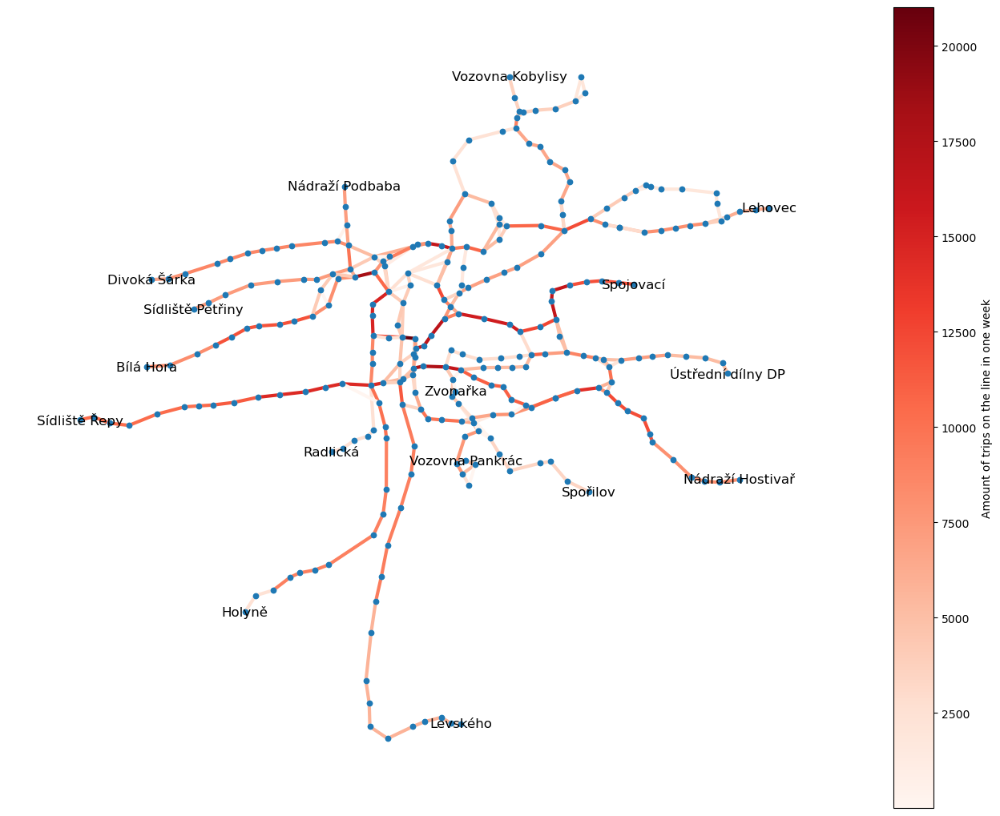

In [25]:
# drawing scaled network
fig = plt.figure(figsize=(13,10))

nodes = nx.draw(G_all, pos=pos, **options, node_size = 20)
nx.draw_networkx_nodes(G_all, pos=pos, node_size = 20) 

nx.draw_networkx_labels(G_all, pos, tmp)

fig.subplots_adjust(right=0.5)

plt.colorbar(sm, orientation='vertical', label='Amount of trips on the line in one week')

plt.show()

#### Centarilty drawing

In [26]:
deg = nx.degree_centrality(G_all)

In [27]:
deg = {k: v for k, v in sorted(deg.items(), key=lambda item: item[1], reverse=True)}

j = 5
for i in deg.keys():
    print(i, '\t',deg[i])
    j-=1
    if(j==0): break

Karlovo náměstí 	 0.02857142857142857
Malostranská 	 0.024999999999999998
Náměstí Bratří Synků 	 0.02142857142857143
Otakarova 	 0.02142857142857143
Strossmayerovo náměstí 	 0.02142857142857143


In [28]:
[list(G_all.degree())[34][1] # aka 8 (karlovo namesti ma 8 vztahu)
 /                           # aka divide
 len(G_all.degree)]          # aka 281 (unikalni zastavky)

[0.028469750889679714]

#### Popis:
*  normalizovany koeficienty, ktere muzeme pouzit pro zvyravneni dulezitych zastavek
*  degree centrality for a node is the fraction of nodes it is connected to node
*  z dat je videt, ze top 5 nejdulezitejsich zastavek jsou:Karlovo náměstí, Malostranská, Náměstí Bratří Synků, Otakarova, Strossmayerovo náměstí

In [29]:
clos = nx.closeness_centrality(G_all)

In [30]:
clos = {k: v for k, v in sorted(clos.items(), key=lambda item: item[1], reverse=True)}

j = 5
for i in clos.keys():
    print(i, '\t',clos[i])
    j-=1
    if(j==0): break

Malostranská 	 0.09978617248752673
Národní divadlo 	 0.09887005649717515
Staroměstská 	 0.09855684618092221
Čechův most 	 0.09828009828009827
Právnická fakulta 	 0.09810791871058164


#### Popis:
*  normalizovany koeficienty, ktere muzeme pouzit pro zvyravneni dulezitych zastavek
*  Closeness centrality of a node is the reciprocal of the average shortest path distance to node over all reachable nodes
*  z dat je videt, ze top 5 nejdulezitejsich zastavek jsou: Malostranská, Národní divadlo, Staroměstská, Čechův most, Právnická fakulta

In [31]:
bet = nx.betweenness_centrality(G_all)

In [32]:
bet = {k: v for k, v in sorted(bet.items(), key=lambda item: item[1], reverse=True)}

j = 5
for i in bet.keys():
    print(i, '\t',bet[i])
    j-=1
    if(j==0): break

Malostranská 	 0.3480734046860337
Národní divadlo 	 0.32212186367096757
Staroměstská 	 0.3087635687400921
Čechův most 	 0.29537667694633774
Strossmayerovo náměstí 	 0.27294872488140176


#### Popis:
*  normalizovany koeficienty, ktere muzeme pouzit pro zvyravneni dulezitych zastavek
*  Betweenness centrality of a node is the sum of the fraction of all-pairs shortest paths that pass through this node 
*  z dat je videt, ze top 5 nejdulezitejsich zastavek jsou: Malostranska, Národní divadlo, Staroměstská, Čechův most, Strossmayerovo náměstí

In [33]:
# function for drawing centrality networks
def draw(G, pos, measures, measure_name):
    plt.figure(figsize=(13,10))
    nodes = nx.draw_networkx_nodes(G, pos, node_size=10, cmap=plt.cm.plasma, 
                                   node_color=list(measures.values()),
                                   nodelist=measures.keys())
    edges = nx.draw_networkx_edges(G, pos)
    nx.draw_networkx_labels(G, pos, tmp, font_size=7)

    plt.title(measure_name)
    plt.colorbar(nodes)
    plt.axis('off')
    plt.show()

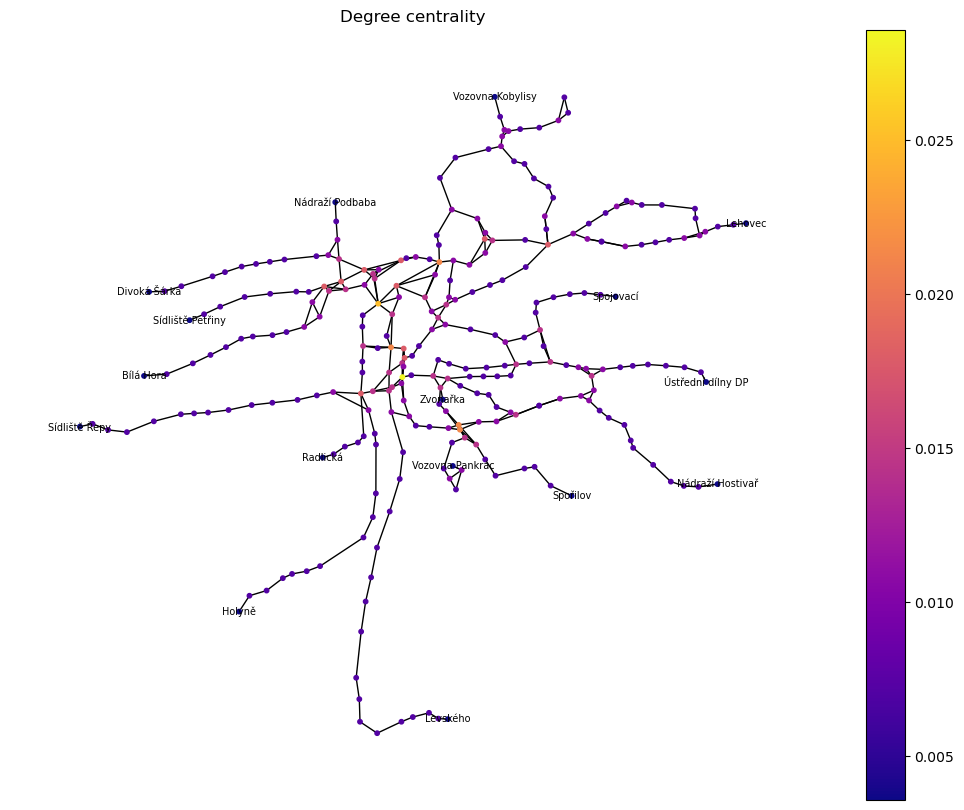

In [34]:
draw(G_all, pos, deg, 'Degree centrality')

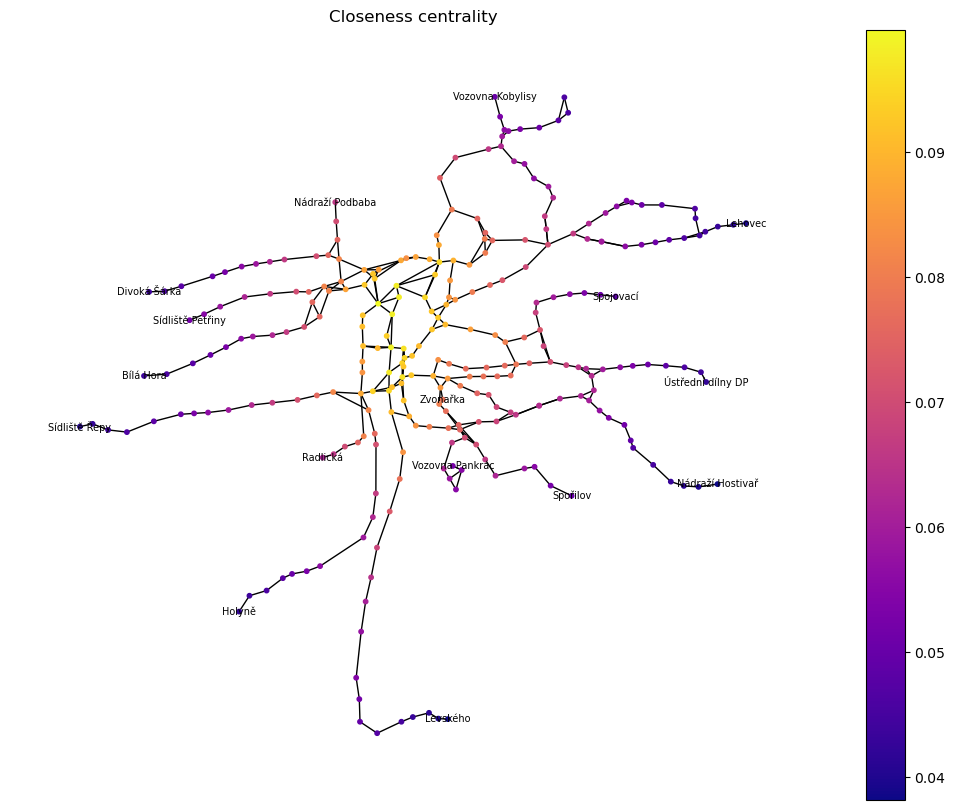

In [35]:
draw(G_all, pos, clos, 'Closeness centrality')

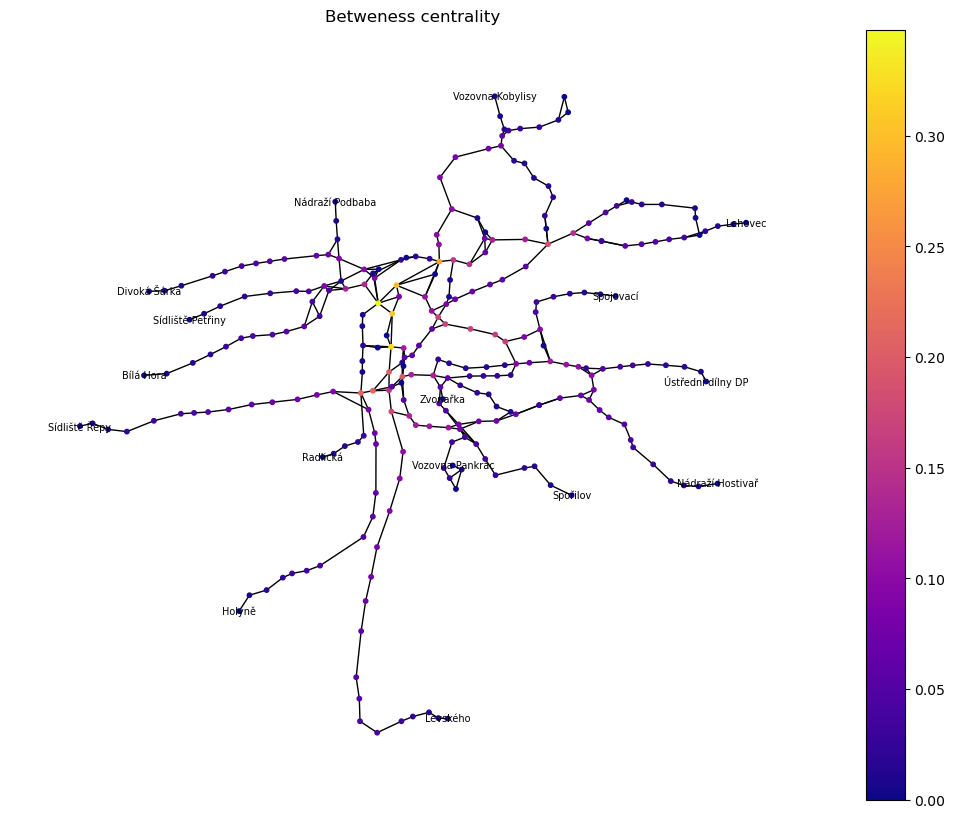

In [36]:
draw(G_all, pos, bet, 'Betweness centrality')

### Vlastni otazka 1:
* Meni se dulezitost zastavky v zavislosty pracovni/vikend/cely tyden

In [37]:
# usefull options

options_week = {
    "node_color": "skyblue",
    "edge_color": [v[2]['weekend_count'] for v in edgelist_week],
    "width":3,
    "edge_cmap": plt.cm.Reds,
    "with_labels": False,
}

options_work = {
    "node_color": "skyblue",
    "edge_color": [v[2]['work_day_count'] for v in edgelist_work],
    "width":3,
    "edge_cmap": plt.cm.Reds,
    "with_labels": False,
}

sm_week = plt.cm.ScalarMappable(cmap=cm.Reds, norm=plt.Normalize(vmin = model_week['weekend_count'].min(), vmax=model_week['weekend_count'].max()))
sm_week._A = [] 

sm_work = plt.cm.ScalarMappable(cmap=cm.Reds, norm=plt.Normalize(vmin = model_work['work_day_count'].min(), vmax=model_work['work_day_count'].max()))
sm_work._A = [] 

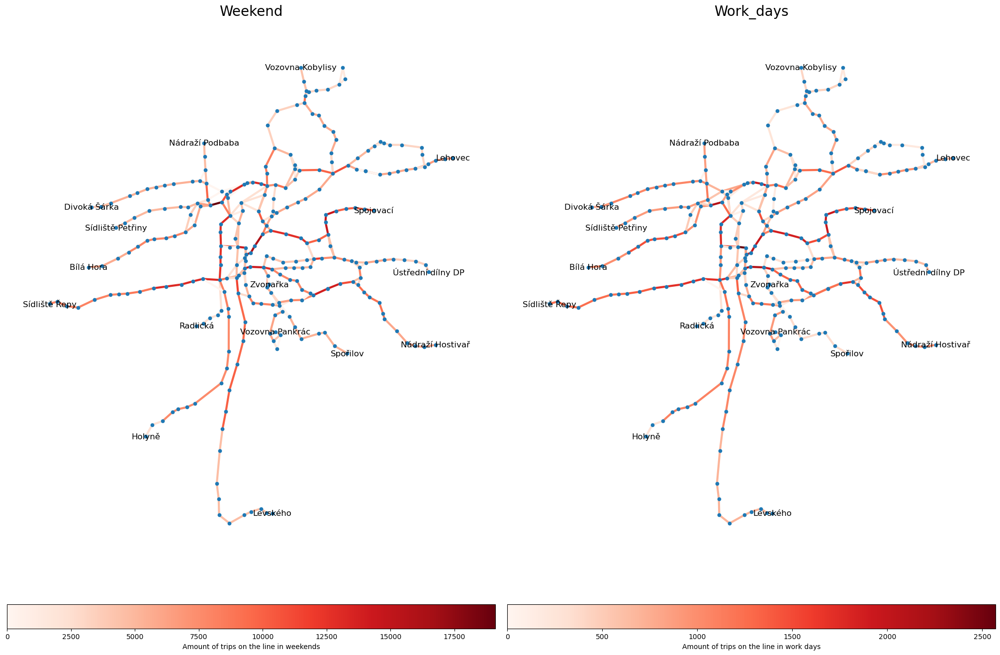

In [38]:
# drawing networks for work_days and weekends for comparing
fig = plt.figure(figsize=(20,13), constrained_layout=True)
spec = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)
ax1 = fig.add_subplot(spec[0, 0]) 
ax2 = fig.add_subplot(spec[0, 1]) 

ax1.title.set_text('Weekend')
ax1.title.set_size(20)

nx.draw(G_week, pos=pos, **options_week, node_size = 20, ax=ax1)
nx.draw_networkx_nodes(G_week, pos=pos, node_size = 20, ax=ax1) 

nx.draw_networkx_labels(G_week, pos, tmp, ax=ax1)


plt.colorbar(sm_work, ax=ax1, orientation='horizontal', label='Amount of trips on the line in weekends')

ax2.title.set_text('Work_days')
ax2.title.set_size(20)

nx.draw(G_work, pos=pos, **options_work, node_size = 20, ax=ax2)
nx.draw_networkx_nodes(G_work, pos=pos, node_size = 20, ax=ax2) 

nx.draw_networkx_labels(G_work, pos, tmp, ax=ax2)

plt.colorbar(sm_week, ax=ax2, orientation='horizontal', label='Amount of trips on the line in work days')

plt.show()

#### Popis:
* grafy skoro stejne, co rika o tom ze dulezitost zastavek se behem pracovnich dnu a vikendu meni proporcionalne celemu tydnu

Malostranská 	 0.09978617248752673
Malostranská 	 0.09978617248752673
Malostranská 	 0.09978617248752673
Národní divadlo 	 0.09887005649717515
Národní divadlo 	 0.09887005649717515
Národní divadlo 	 0.09887005649717515
Staroměstská 	 0.09855684618092221
Staroměstská 	 0.09855684618092221
Staroměstská 	 0.09855684618092221
Čechův most 	 0.09828009828009827
Čechův most 	 0.09828009828009827
Čechův most 	 0.09828009828009827
Právnická fakulta 	 0.09810791871058164
Právnická fakulta 	 0.09810791871058164
Právnická fakulta 	 0.09810791871058164


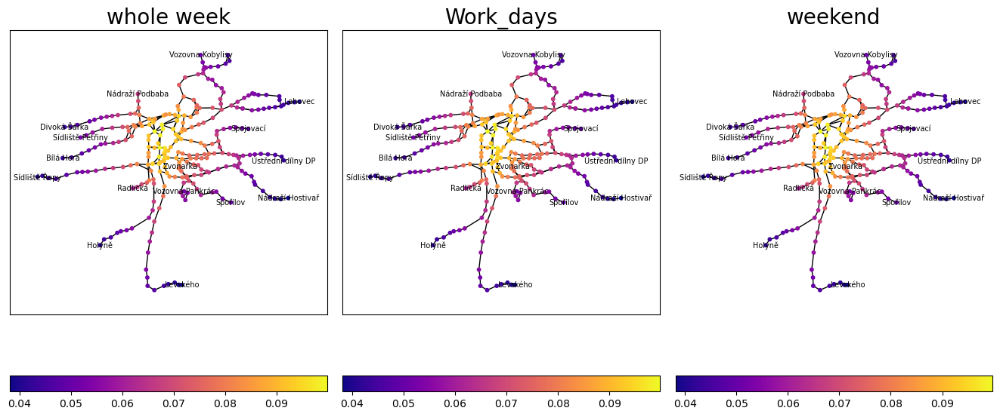

In [39]:
# drawing 3 networks one by one for visual comparing  
clos_work = nx.closeness_centrality(G_work)
clos_work = {k: v for k, v in sorted(clos_work.items(), key=lambda item: item[1], reverse=True)}

clos_week = nx.closeness_centrality(G_week)
clos_week = {k: v for k, v in sorted(clos_week.items(), key=lambda item: item[1], reverse=True)}

j = 5
for i in clos_week.keys():
    print(i, '\t',clos[i])
    print(i, '\t',clos_week[i])
    print(i, '\t',clos_work[i])
    j-=1
    if(j==0): break


fig = plt.figure(figsize=(13,7))

spec = gridspec.GridSpec(ncols=3, nrows=1,  left=49, right=50,wspace=0.05, figure=fig)
ax1 = fig.add_subplot(spec[0, 0]) 
ax2 = fig.add_subplot(spec[0, 1]) 
ax3 = fig.add_subplot(spec[0, 2]) 
ax1.title.set_text('whole week')
ax1.title.set_size(20)
    
nodes = nx.draw_networkx_nodes(G_all, pos, node_size=10, cmap=plt.cm.plasma, 
                               node_color=list(clos.values()),
                               nodelist=clos.keys(), ax=ax1)
edges = nx.draw_networkx_edges(G_all, pos, ax=ax1)
nx.draw_networkx_labels(G_all, pos, tmp, font_size=7, ax=ax1)
plt.colorbar(nodes, orientation='horizontal', ax=ax1)


ax2.title.set_text('Work_days')
ax2.title.set_size(20)
nodes = nx.draw_networkx_nodes(G_work, pos, node_size=10, cmap=plt.cm.plasma, 
                                   node_color=list(clos_work.values()),
                                   nodelist=clos_work.keys(),ax=ax2)
edges = nx.draw_networkx_edges(G_work, pos,ax=ax2)
nx.draw_networkx_labels(G_work, pos, tmp, font_size=7,ax=ax2)
plt.colorbar(nodes, orientation='horizontal', ax=ax2)

    
ax3.title.set_text('weekend')
ax3.title.set_size(20)

nodes = nx.draw_networkx_nodes(G_week, pos, node_size=10, cmap=plt.cm.plasma, 
                                   node_color=list(clos_week.values()),
                                   nodelist=clos_week.keys(), ax=ax3)
edges = nx.draw_networkx_edges(G_week, pos,ax=ax3)
nx.draw_networkx_labels(G_week, pos, tmp, font_size=7,ax=ax3)
plt.colorbar(nodes, orientation='horizontal', ax=ax3)

plt.axis('off')

plt.show()


#### Popis:
* jsou stejne dulezite podle closeness_centrality, a jejich "weight" neovlivnuje na koeficienty

In [40]:
# labels
labels_all = {edge: G_all.edges[edge]['week_count']for edge in G_all.edges}
labels_work = {edge: G_work.edges[edge]['work_day_count']for edge in G_work.edges}
labels_week = {edge: G_week.edges[edge]['weekend_count']for edge in G_week.edges}

In [41]:
# axes
x_all= list(labels_all.values())
y= list(labels_all.keys())
x_week = list(labels_week.values())
x_work = list(labels_work.values())

In [42]:
# ylabels rename
for i in range(len(y)):
    y[i] = str(str(y[i][0])+ ' -> ' + str(y[i][1]))

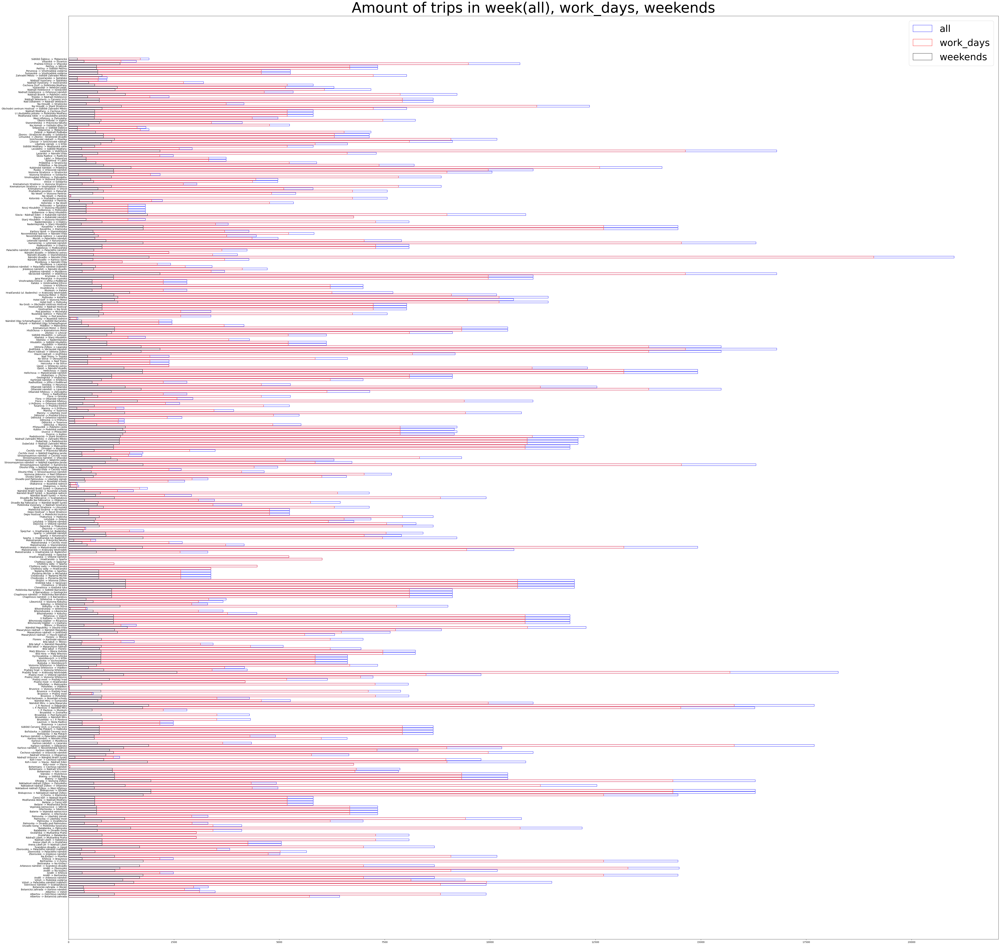

In [43]:
# drawing graph
plt.figure(figsize=(70,70))
plt.title('Amount of trips in week(all), work_days, weekends', fontsize=60)
plt.barh(y, x_all, edgecolor='blue', fill=False)
plt.barh(y, x_work, edgecolor='red', fill=False)
plt.barh(y, x_week, edgecolor='black', fill=False)
plt.legend(labels = ['all', 'work_days', 'weekends'], fontsize=40)
plt.show()

#### Popis:
* ze grafu je videt, ze mame presnou proporcionalitu, jestli zastavka dulezita cely tyden, tim padem zustava dulezita i o vikendu i pracovni dni, mnozstvi projezdu se zmenuji ale navzajem jsou stejne dulezity

### Vlastni otazka 2:
* jak se meni mnozstvi projezdu tramvaju ohledne casu

In [44]:
# subsets of tram dataset depends on week_count, work_days_count, weekends_count
week = tram.groupby(['depart_from'], as_index=False)['week_count'].sum()
work = tram.groupby(['depart_from'], as_index=False)['work_day_count'].sum()
weekend = tram.groupby(['depart_from'], as_index=False)['weekend_count'].sum()

In [45]:
# get certain data of subsets
work[['depart_from_hours', 'depart_from_minutes', 'depart_from_seconds']] = work['depart_from'].str.split(':', expand=True)
work['time'] = work['depart_from_hours']
work.drop(columns=['depart_from', 'depart_from_hours', 'depart_from_minutes', 'depart_from_seconds'], inplace=True)

weekend[['depart_from_hours', 'depart_from_minutes', 'depart_from_seconds']] = weekend['depart_from'].str.split(':', expand=True)
weekend['time'] = weekend['depart_from_hours']
weekend.drop(columns=['depart_from', 'depart_from_hours', 'depart_from_minutes', 'depart_from_seconds'], inplace=True)

week[['depart_from_hours', 'depart_from_minutes', 'depart_from_seconds']] = week['depart_from'].str.split(':', expand=True)
week['time'] = week['depart_from_hours']
week.drop(columns=['depart_from', 'depart_from_hours', 'depart_from_minutes', 'depart_from_seconds'], inplace=True)

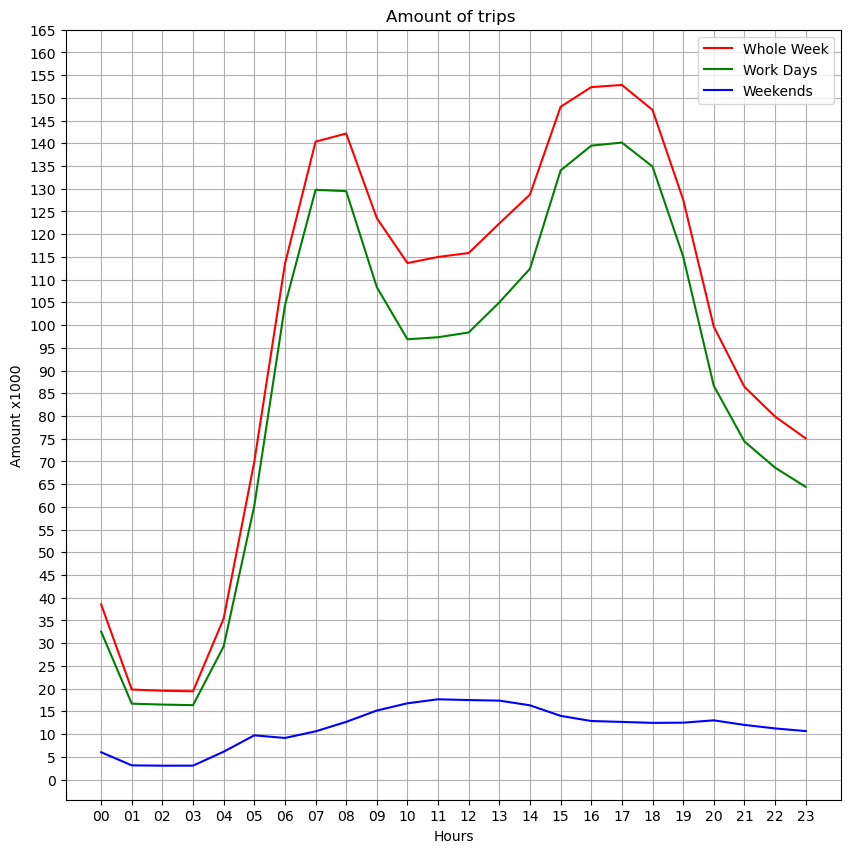

In [46]:
# drawing subsets
plt.figure(figsize=(10,10))

plt.plot(list(week.iloc[:,1]),list(week.iloc[:,0]/ 1000), color="red")
plt.plot(list(work.iloc[:,1]),list(work.iloc[:,0]/1000), color="green")
plt.plot(list(weekend.iloc[:,1]),list(weekend.iloc[:,0] / 1000), color="blue")

plt.yticks(np.arange(0, 170, step=5)) 

plt.xlabel('Hours')
plt.ylabel('Amount x1000')

plt.title('Amount of trips ')
plt.legend(['Whole Week', 'Work Days', 'Weekends'])
plt.grid()

plt.show()

#### Popis:
* ze grafu je videt, ze v obdobi od 4 hodiny rano zacina rychle zvetsovat mnozstvi projezdu tramvaju ve pracovni dni, mezi 10 a 12 nejmin tramvaju,  pak mezi 15 a 18 hodinami se zvetsuje, vsechno vapada logicke: rano lidi jedou do prace proto musi DPM resit problem velkeho mnozstvi lidi, kdyz lidi pracujou, vetsine neni potreba pouzit DPM proto se zmensuje, pak musime jet domu, znovu zvetsuje. O vikendu jsme skoro vsichni odpocivame ve dome, proto velmi malo jizdi tramvaju

### Vlastni otazka 3:
* jak vytížená je trasa v určitou hodinu pro každé route_type

In [47]:
# function calculate week_count for each hour
def group(df):
    df = df.groupby(['depart_from'], as_index=False)['week_count'].sum()
    return df

In [48]:
# function get certain data (time and count on this time) of subset
def blabla(df):
    df[['depart_from_hours', 'depart_from_minutes', 'depart_from_seconds']] = df['depart_from'].str.split(':', expand=True)
    df['time'] = df['depart_from_hours']
    df.drop(columns=['depart_from', 'depart_from_hours', 'depart_from_minutes', 'depart_from_seconds'], inplace=True)
    return df

In [49]:
# subsets of main dataset (data)
tram = data[data['route_type'] == 0].copy()
subw = data[data['route_type'] == 1].copy()
rail = data[data['route_type'] == 2].copy()
bus = data[data['route_type'] == 3].copy()
feer = data[data['route_type'] == 4].copy()
funic = data[data['route_type'] == 7].copy()

In [50]:
tram=group(tram)
subw=group(subw)
rail=group(rail)
bus=group(bus)
feer=group(feer)
funic=group(funic)

In [51]:
tram = blabla(tram)
subw=blabla(subw)
rail=blabla(rail)
bus=blabla(bus)
feer=blabla(feer)
funic=blabla(funic)

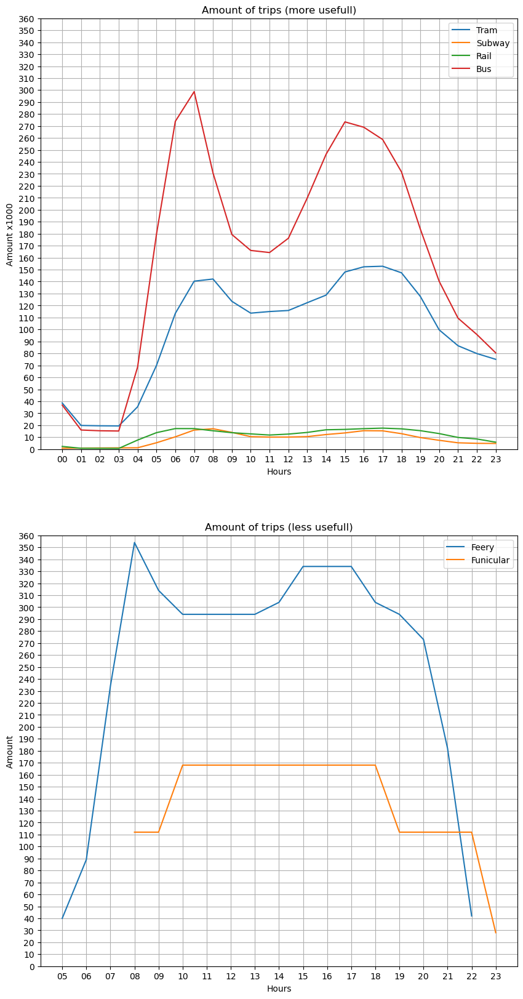

In [52]:
# drawing subsets for visual comparing
fig = plt.figure(figsize=(10,20))
spec = gridspec.GridSpec(ncols=1, nrows=2, figure=fig)
ax1 = fig.add_subplot(spec[0, :]) 
ax2 = fig.add_subplot(spec[1, :]) 

ax1.plot(list(tram.iloc[:,1]),list(tram.iloc[:,0]/1000))
ax1.plot(list(subw.iloc[:,1]),list(subw.iloc[:,0]/1000))
ax1.plot(list(rail.iloc[:,1]),list(rail.iloc[:,0]/1000))
ax1.plot(list(bus.iloc[:,1]),list(bus.iloc[:,0]/1000))

ax2.plot(list(feer.iloc[:,1]),list(feer.iloc[:,0]))
ax2.plot(list(funic.iloc[:,1]),list(funic.iloc[:,0]))

ax1.set_yticks(np.arange(0, 370, step=10)) 
ax2.set_yticks(np.arange(0, 370, step=10)) 

ax1.set_xlabel('Hours')
ax1.set_ylabel('Amount x1000')
ax1.set_title('Amount of trips (more usefull)')

ax2.set_xlabel('Hours')
ax2.set_ylabel('Amount')
ax2.set_title('Amount of trips (less usefull)')

ax1.legend(['Tram', 'Subway', 'Rail', 'Bus'])
ax2.legend(['Feery', 'Funicular'])
ax1.set_ylim(ymin=0)
ax2.set_ylim(ymax=360)
ax1.grid()
ax2.grid()

plt.show()

#### Popis:
* vykreslil jsem grafy zvlast protoze jak muzete videt podle osy Y na prvnim grafu tisici, a na druhem jen sety, co rika o jejich uzitecnosti
* resil jsem vykreslit jeden na druhem, protoze pokud to vykreslim na jedne horizontalni primce, tak vetsina lidi budou zmateny kvuli scalengu, ze jeden ma 1000 a druhej 100 ale cisla jsou stejne i tam i tam je ymax= 360